## Visualizing what convnets learn

It is often said that deep learning models are "black boxes", learning representations that are difficult to extract and present in a human-readable form. While this is partially true for certain types of deep learning models, it is definitely not true for convnets. The representations learned by convnets are highly amenable to visualization, in large part because they are . Since 2013, a wide array of representations of visual concepts
techniques have been developed for visualizing and interpreting these representations. Three of the most accessible and useful ones:

- Visualizing intermediate convnet outputs ("intermediate activations"). This is useful to understand how successive convnet layers transform their input, and to get a first idea of the meaning of individual convnet filters.
- Visualizing convnets filters. This is useful to understand precisely what visual pattern or concept each filter in a convnet is receptive to.
- Visualizing heatmaps of class activation in an image. This is useful to understand which part of an image where identified as belonging to a given class, and thus allows to localize objects in images.

### Part 1: Visualizing intermediate activations

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_11 (Conv2D)                   │ (None, 148, 148, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 74, 74, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 72, 72, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 36, 36, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 34, 34, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 17, 17, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_14 (Conv2D)                   │ (None, 15, 15, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 7, 7, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 6272)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 6272)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 512)                 │       3,211,776 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,906,244 (26.35 MB)

 Trainable params: 3,453,121 (13.17 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,453,123 (13.17 MB)

(1, 150, 150, 3)


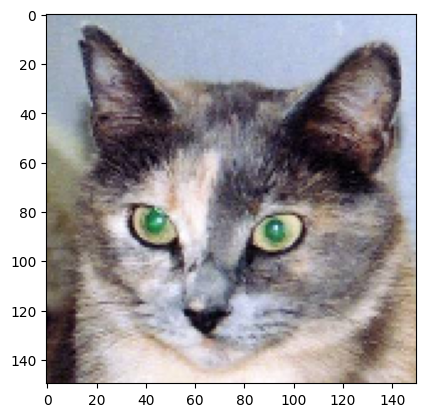

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
(1, 148, 148, 32)


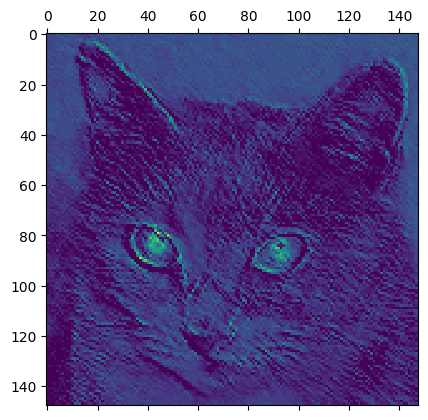

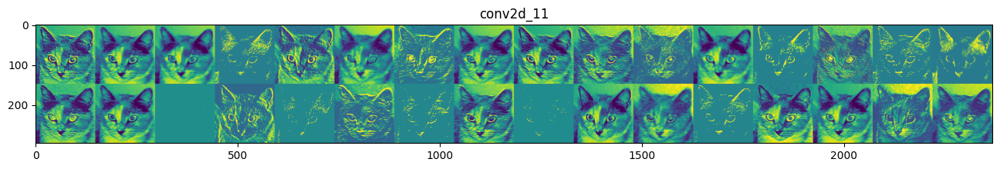

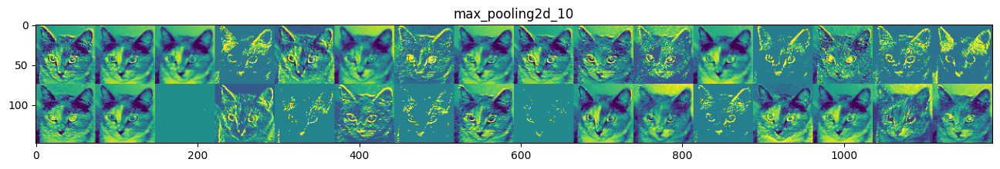

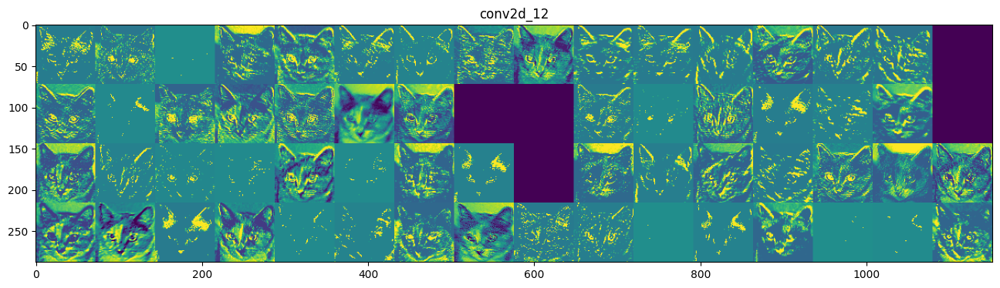

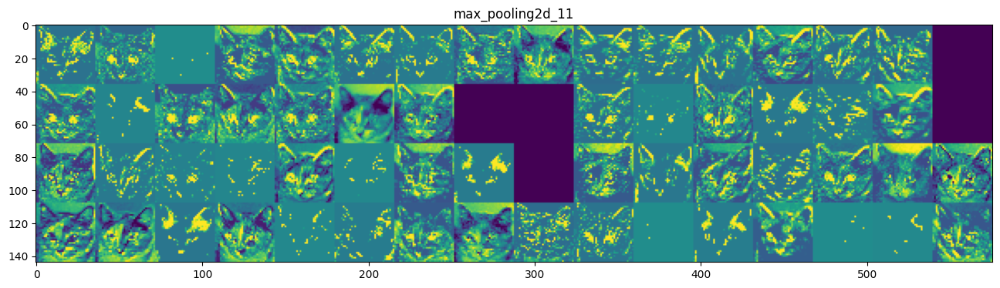

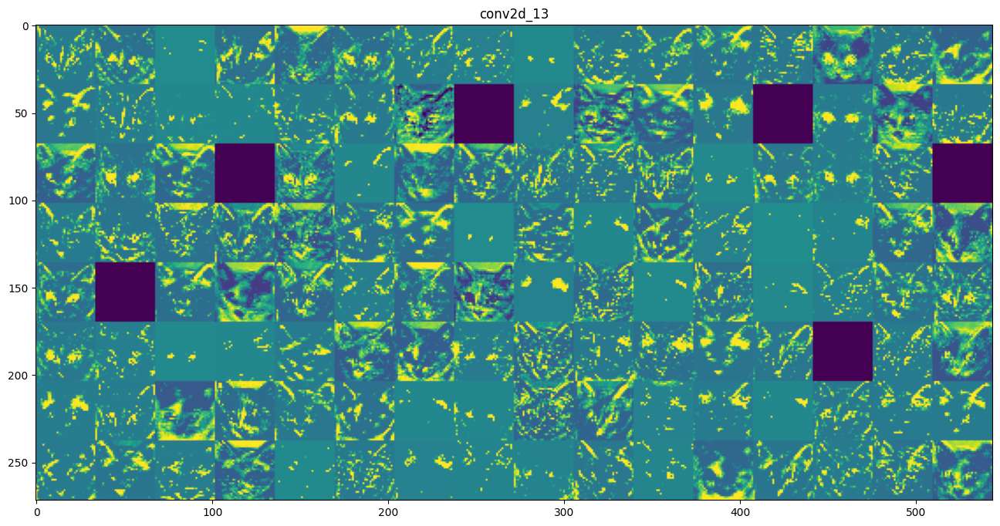

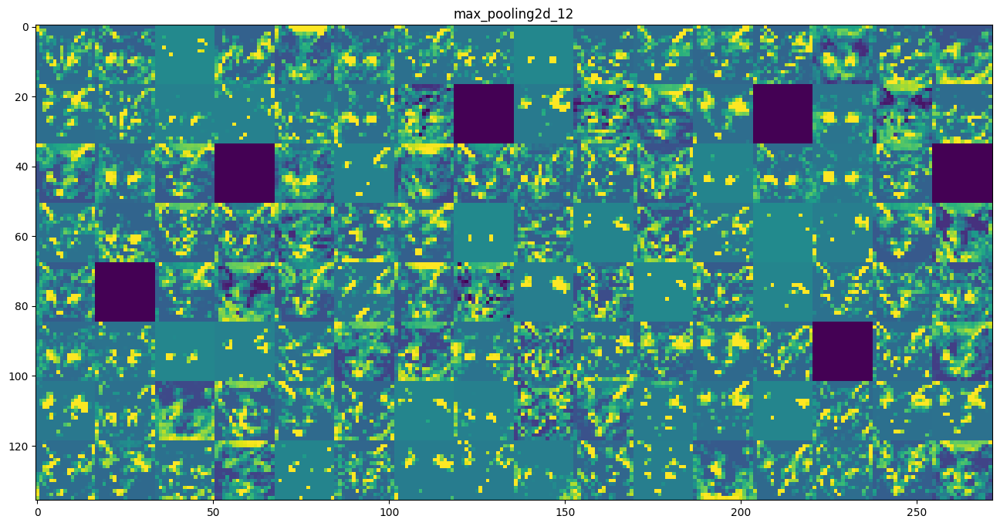

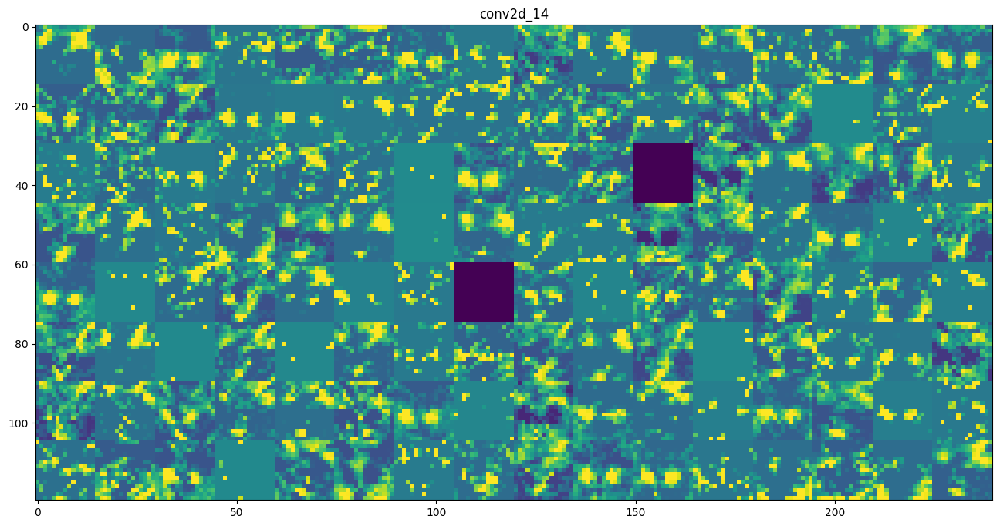

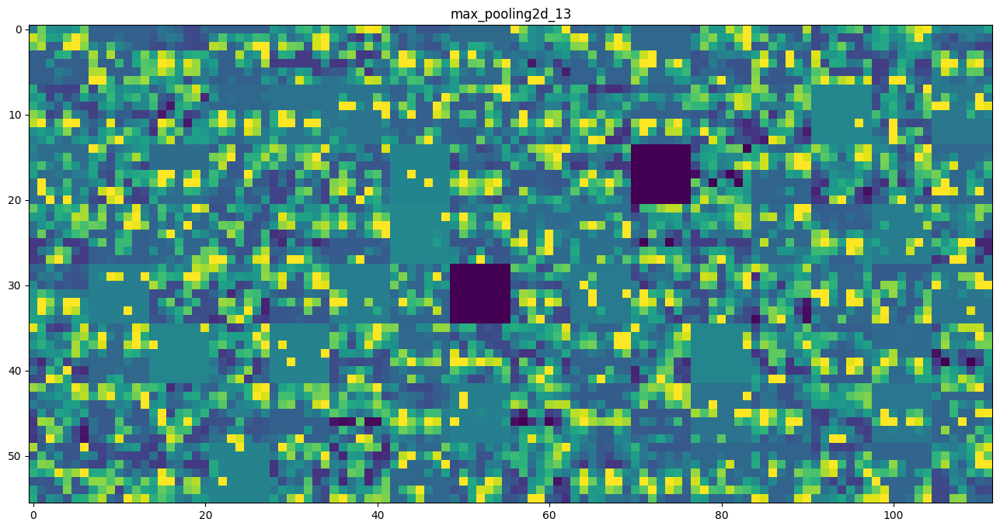

In [2]:
import os
base_dir = r'F:\learning\Deep Learning\ch05\cats_and_dogs_small'
pa = os.path.join(base_dir,'cats_and_dogs_small_2.keras')

from keras.models import load_model
model = load_model(pa)
model.summary()  # As a reminder.

# We preprocess the image into a 4D tensor
from keras.preprocessing import image
import numpy as np
# When code is trying to "divide by zero" or "divide by NaN". If we don't want it to bother us
np.seterr(divide='ignore', invalid='ignore')

img_path = 'F:\learning\Deep Learning\ch05\cats_and_dogs_small/test/cats/cat.1700.jpg'
img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
# Remember that the model was trained on inputs
# that were preprocessed in the following way:
img_tensor /= 255.
# Its shape is (1, 150, 150, 3)
print(img_tensor.shape)

import matplotlib.pyplot as plt
plt.imshow(img_tensor[0])
plt.show()

from keras import models
# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in model.layers[:8]]
# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model.layers[0].input, outputs=layer_outputs)

# This will return a list of 5 Numpy arrays:
# one array per layer activation
activations = activation_model.predict(img_tensor)

first_layer_activation = activations[0]
print(first_layer_activation.shape)

plt.matshow(first_layer_activation[0, :, :, 13], cmap='viridis')
plt.show()


import keras
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16
# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row # number of row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,:, :,col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image
    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')    
plt.show()

### Part 2: Visualizing convnet filters


Step 0: Activation = 15.3782
Step 10: Activation = 35.4174
Step 20: Activation = 56.6788
Step 0: Activation = 0.9706
Step 10: Activation = 44.2286
Step 20: Activation = 98.1225
Step 0: Activation = 95.3928
Step 10: Activation = 130.0305
Step 20: Activation = 164.6682
Step 0: Activation = 3.5995
Step 10: Activation = 16.8167
Step 20: Activation = 30.3175
Step 0: Activation = 0.0000
Step 10: Activation = 0.0000
Step 20: Activation = 0.0000
Step 0: Activation = 2.1369
Step 10: Activation = 5.2040
Step 20: Activation = 11.4291
Step 0: Activation = 5.2340
Step 10: Activation = 7.0696
Step 20: Activation = 9.0077
Step 0: Activation = 4.7445
Step 10: Activation = 18.4640
Step 20: Activation = 32.8870
Step 0: Activation = 30.6732
Step 10: Activation = 64.9878
Step 20: Activation = 99.3023
Step 0: Activation = 5.6496
Step 10: Activation = 25.8207
Step 20: Activation = 47.3438
Step 0: Activation = 4.2880
Step 10: Activation = 6.8948
Step 20: Activation = 11.3279
Step 0: Activation = 94.9274
Ste

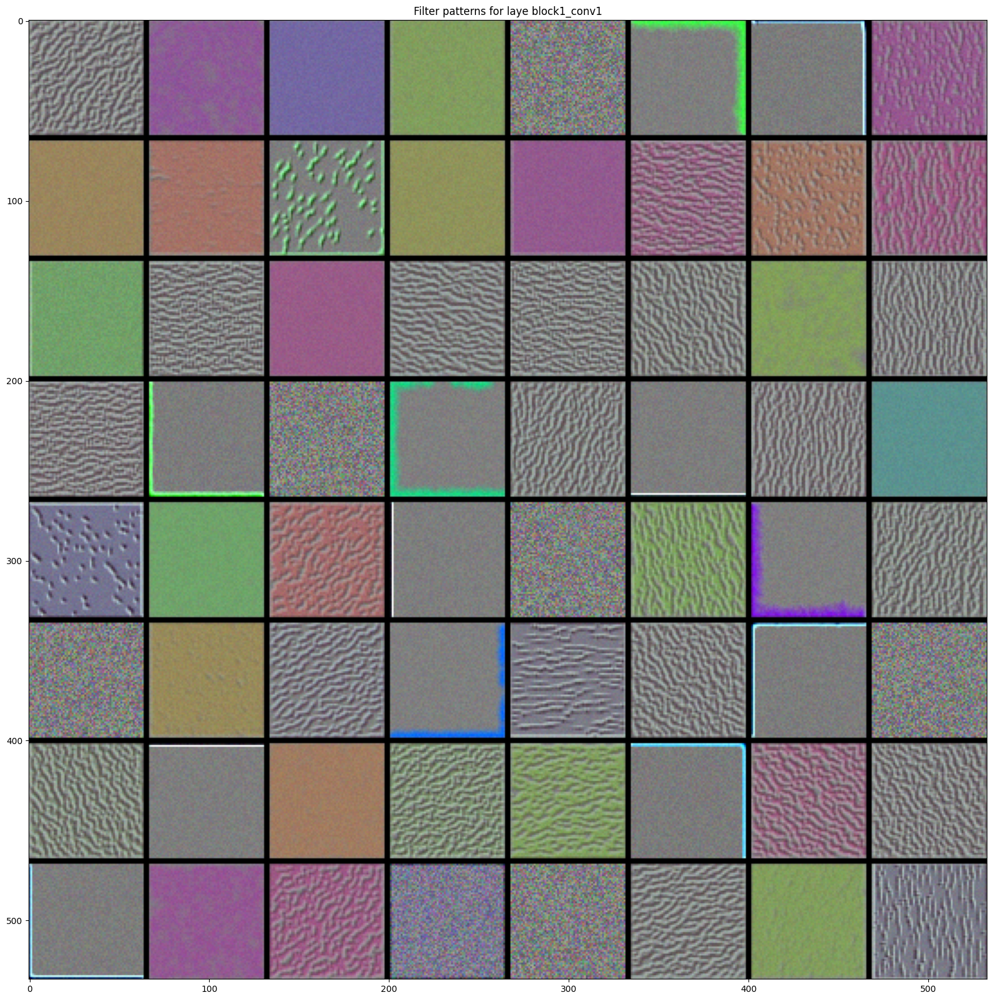

Step 0: Activation = 600.8401
Step 10: Activation = 2690.3022
Step 20: Activation = 4229.1372
Step 0: Activation = 23.1058
Step 10: Activation = 2158.7415
Step 20: Activation = 3594.0203
Step 0: Activation = 123.4976
Step 10: Activation = 1986.6431
Step 20: Activation = 3281.3887
Step 0: Activation = 12.9140
Step 10: Activation = 2159.4629
Step 20: Activation = 3284.8447
Step 0: Activation = 185.7410
Step 10: Activation = 1611.9249
Step 20: Activation = 2522.0852
Step 0: Activation = 36.7667
Step 10: Activation = 1773.5554
Step 20: Activation = 3098.7351
Step 0: Activation = 281.2068
Step 10: Activation = 1932.0057
Step 20: Activation = 2843.0249
Step 0: Activation = 219.7861
Step 10: Activation = 2099.0654
Step 20: Activation = 3438.5579
Step 0: Activation = 72.3051
Step 10: Activation = 1545.1117
Step 20: Activation = 2640.6980
Step 0: Activation = 1.2114
Step 10: Activation = 290.7914
Step 20: Activation = 713.9462
Step 0: Activation = 1.0058
Step 10: Activation = 1687.5865
Step 20:

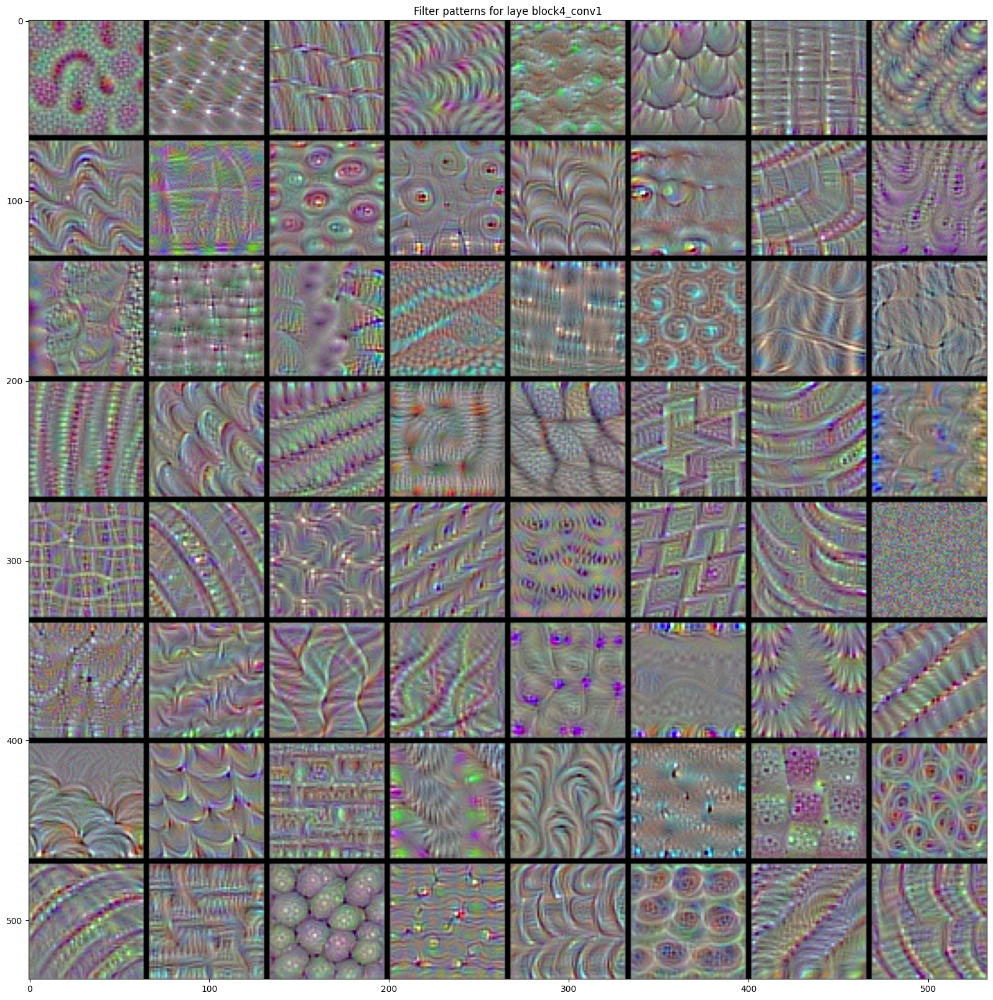

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model

# Clear any existing session
tf.keras.backend.clear_session()

# Load the model
model = VGG16(weights='imagenet', include_top=False)

# Create a simpler function to visualize filter patterns
def visualize_filter_pattern_tf2(model, layer_name, filter_index, 
                               img_size=64, steps=30, lr=1):
    """TensorFlow 2.x compatible version for visualizing filter patterns"""  
    # Create a model that outputs the specific layer's activations
    target_layer = model.get_layer(layer_name)
    feature_extractor = Model(inputs=model.input, outputs=target_layer.output)
    
    # Initialize the input image with random values
    # Note: We use tf.Variable so we can track gradients
    input_img = tf.Variable(np.random.random((1, size, size, 3)) * 20 + 128)
    #input_img = tf.Variable(tf.random.uniform((1, img_size, img_size, 3), minval=0.4, maxval=0.6))
    
    # Gradient ascent loop
    for i in range(steps):
        with tf.GradientTape() as tape:
            tape.watch(input_img)
            
            # Get activations for the input image
            activations = feature_extractor(input_img)
            
            # Extract the specific filter's activation
            # Use tf.gather or direct indexing
            filter_activation = activations[:, :, :, filter_index]
            
            # Compute the loss (we want to maximize this activation)
            loss = -tf.reduce_mean(filter_activation)  # Negative because we use gradient ascent
            
        # Compute gradients
        grads = tape.gradient(loss, input_img)
        
        # Normalize gradients (important for stability)
        grads = grads / (tf.sqrt(tf.reduce_mean(tf.square(grads))) + 1e-5)
        
        # Update the image using gradient ASCENT (we subtract because loss is negative)
        input_img.assign_sub(lr * grads)
        
        # Optional: Print progress
        if i % 10 == 0:
            current_activation = -loss.numpy()  # Convert back to positive
            print(f"Step {i}: Activation = {current_activation:.4f}")
    
    # Get the generated image
    img = input_img.numpy()[0]
    
    # Post-process for visualization
    img = deprocess_image(img) 
    return img

def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

for layer_name in ['block1_conv1', 'block4_conv1']:
    margin = 3
    size=64
    # This a empty (black) image where we will store our results.
    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3))

    for i in range(8):  # iterate over the rows of our results grid
        for j in range(8):  # iterate over the columns of our results grid
            # Generate the pattern for filter `i + (j * 8)` in `layer_name`
            filter_img = visualize_filter_pattern_tf2(model, layer_name, i + (j * 8))

            # Put the result in the square `(i, j)` of the results grid
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img

    # Display the results grid
    plt.figure(figsize=(20, 20))
    plt.imshow(results.astype(np.uint8))
    plt.title(f'Filter patterns for layer {layer_name}')
    plt.show()

### Part 3: Visualizing heatmaps of class activation

The elephant data can be downloaded here： https://s3.amazonaws.com/book.keras.io/img/ch5/creative_commons_elephant.jpg

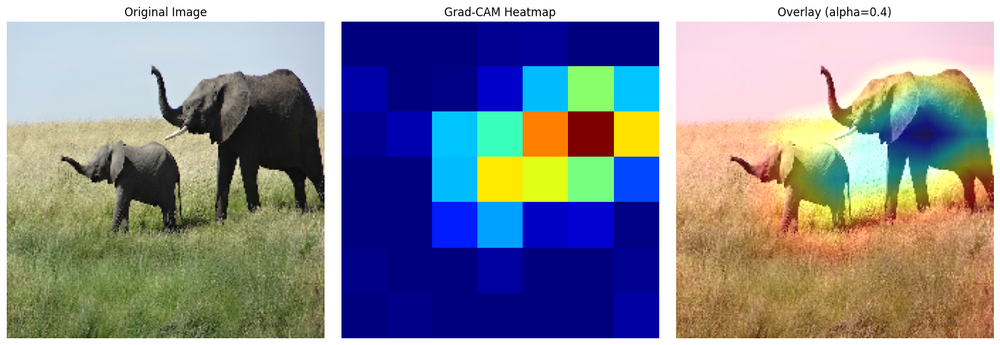

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Top 5 predictions:
1. African_elephant: 93.18%
2. tusker: 3.19%
3. water_buffalo: 2.18%
4. warthog: 0.57%
5. Indian_elephant: 0.35%


In [4]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input
import cv2

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    """
    Create Grad-CAM heatmap
    """
    # Create model that maps input to: last conv layer output + predictions
    grad_model = Model(
        inputs=model.input,
        outputs=[model.get_layer(last_conv_layer_name).output, model.output]
    )
    
    # Record operations for automatic differentiation
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
            
        class_channel = preds[:, pred_index]
    
    # Gradient of output class with respect to last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)
    
    # Pool gradients over spatial dimensions
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    
    # Weight the feature maps
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    
    # Normalize between 0 and 1
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-8)
    
    return heatmap.numpy(), pred_index.numpy()

# Example with ResNet50
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions

# Load model
model = ResNet50(weights='imagenet')

# Prepare image
#img_path = 'dog.jpg'
img_path = r'C:\Users\li\Desktop\creative_commons_elephant.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = preprocess_input(img_array)

# Generate heatmap
last_conv_layer_name = 'conv5_block3_out'  # For ResNet50
heatmap, class_idx = make_gradcam_heatmap(
    img_array, 
    model, 
    last_conv_layer_name
)

# Display
def display_gradcam(img, heatmap, alpha=0.4):
    """Display Grad-CAM heatmap overlay"""
    # Resize heatmap to match image
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    
    # Convert heatmap to RGB
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    
    # Superimpose
    superimposed_img = heatmap * alpha + img
    superimposed_img = np.clip(superimposed_img, 0, 255).astype('uint8')
    
    return superimposed_img

# Create visualization
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Original image
axes[0].imshow(img)
axes[0].set_title('Original Image')
axes[0].axis('off')

# Heatmap
axes[1].imshow(heatmap, cmap='jet')
axes[1].set_title('Grad-CAM Heatmap')
axes[1].axis('off')

# Overlay
overlay = display_gradcam(np.array(img), heatmap, alpha=0.4)
axes[2].imshow(overlay)
axes[2].set_title('Overlay (alpha=0.4)')
axes[2].axis('off')

plt.tight_layout()
plt.show()

# Show predictions
preds = model.predict(img_array)
print("Top 5 predictions:")
for i, (imagenet_id, label, score) in enumerate(decode_predictions(preds, top=5)[0]):
    print(f"{i+1}. {label}: {score:.2%}")

<font color="green">
    
This visualisation technique answers two important questions:
- Why did the network think this image contained an African elephant?
- Where is the African elephant located in the picture?
  
</font>